# Domestic Load Research Programme Customer Class Inference

**Setup instructions**

0. Best to install latest libpgm from git

NOT GOOD
1. Install libpgm with `pip install libpgm`
2. Execute 
    ```
    2to3 -w /home/user/anaconda3/lib/python3.6/site-packages/libpgm/nodedata.py
    2to3 -w /home/user/anaconda3/lib/python3.6/site-packages/libpgm/discretebayesiannetwork.py
    2to3 -w /home/user/anaconda3/lib/python3.6/site-packages/libpgm/graphskeleton.py
    2to3 -w /home/user/anaconda3/lib/python3.6/site-packages/libpgm/tablecpdfactorization.py
    2to3 -w /home/user/anaconda3/lib/python3.6/site-packages/utils/bntextutils.py
    ```
   from the command prompt

## Support functions for BN construction and inference

In [2]:
#load support functions
import experiment.algorithms.BNve as bn
import features.feature_extraction as fx
import experiment.exp_plot as exp_plot
from math import ceil

#initiate offline plotting for plotly
import plotly.offline as offline
import plotly.graph_objs as go
from plotly import tools
offline.init_notebook_mode(connected=True)

from IPython.core.display import Image

#set data directory that contains evidence
spec_file = 'exp1_spec'
yearstart = 2000
yearend = 2014
param_file = 'exp1_BNve_1' #text file containing model parameters
model = param_file
evidence_dir = 'exp1' #directory containing evidence/observations

## BN Graph Visualisation

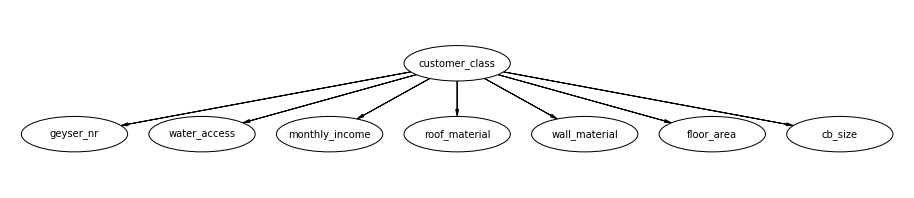

In [5]:
bn.graphViz(param_file)
#Image('experiment/images/'+param_file+'.png')

## BN Evidence

### Generate evidence set for the customer class model.

In [4]:
fx.saveData(yearstart, yearend, spec_file)

Success! Saved to data/feature_data/exp1/exp1_evidence_2000.txt
Success! Saved to data/feature_data/exp1/exp1_evidence_2001.txt
Success! Saved to data/feature_data/exp1/exp1_evidence_2002.txt
Success! Saved to data/feature_data/exp1/exp1_evidence_2003.txt
Success! Saved to data/feature_data/exp1/exp1_evidence_2004.txt
Success! Saved to data/feature_data/exp1/exp1_evidence_2005.txt
Success! Saved to data/feature_data/exp1/exp1_evidence_2006.txt
(2007, 'No survey data collected for this year')
Saving empty file
Success! Saved to data/feature_data/exp1/exp1_evidence_2008.txt
Success! Saved to data/feature_data/exp1/exp1_evidence_2009.txt
Success! Saved to data/feature_data/exp1/exp1_evidence_2010.txt
Success! Saved to data/feature_data/exp1/exp1_evidence_2011.txt
Success! Saved to data/feature_data/exp1/exp1_evidence_2012.txt
(2013, 'No survey data collected for this year')
Saving empty file
Success! Saved to data/feature_data/exp1/exp1_evidence_2014.txt
Log entries added to log/log_gener

## BN Inference

### Generate probability distribution over customer_class variable | evidence

In [6]:
classes12 = bn.inferCustomerClasses(param_file, evidence_dir, 2000)
print(classes12.head())
len(classes12)

         rural village informal_settlement township urban_res_7  \
AnswerID                                                          
34        None    None                None     None        None   
230       None    None                None     None        None   
43        None    None                None     None        None   
44        None    None                None     None        None   
111       None    None                None     None        None   

         urban_townhouse_7-8 urban_res_8-9 urban_townhouse_9-10  \
AnswerID                                                          
34                      None          None                 None   
230                     None          None                 None   
43                      None          None                 None   
44                      None          None                 None   
111                     None          None                 None   

         urban_estate_10+  
AnswerID                   
34  

904

### Save inferred class probability distribution for customers

In [6]:
bn.saveClasses(yearstart, yearend, param_file, evidence_dir)

Success! Saving to class_data/exp1_BNve_1/classes_2000.csv
Success! Saving to class_data/exp1_BNve_1/classes_2001.csv
Success! Saving to class_data/exp1_BNve_1/classes_2002.csv
Success! Saving to class_data/exp1_BNve_1/classes_2003.csv
Success! Saving to class_data/exp1_BNve_1/classes_2004.csv
Success! Saving to class_data/exp1_BNve_1/classes_2005.csv
Success! Saving to class_data/exp1_BNve_1/classes_2006.csv
(2007, 'No evidence data available for this year')
Saving empty file
Success! Saving to class_data/exp1_BNve_1/classes_2008.csv
Success! Saving to class_data/exp1_BNve_1/classes_2009.csv
Success! Saving to class_data/exp1_BNve_1/classes_2010.csv
Success! Saving to class_data/exp1_BNve_1/classes_2011.csv
Success! Saving to class_data/exp1_BNve_1/classes_2012.csv
(2013, 'No evidence data available for this year')
Saving empty file
Success! Saving to class_data/exp1_BNve_1/classes_2014.csv
Log entries added to log/log_inferClasses.csv



### Visualise inferred customer classes

In [3]:
class_dir = param_file

exp_plot.plotClassDist(2011, class_dir)

In [5]:
exp_plot.plotClassYearRange(2000, 2005, class_dir)